# Import packages

In [1]:
import time

beginning = time.time()

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
import logging

In [5]:
import sys
import os 

#Completely optional, this helps time different parts of the code
from timer_class import Timer

# Section 1: Initialize Data

### Create Buckets
- First, create a dataframe to split SIC codes into columns sorted by industry.#

### Initialize Data from WRDS (Wharton Research Data Services)
- The downloaded data stacks all ticker data vertically. We will process this data in the next secti#on.

### Load Table That Maps Stock-Specific Permno to More General SIC Code

### Calculate Market Cap from WRDS Table
- Use closing price data and outstanding shares.

In [8]:
### First step: Create a buucket df; this will be useful at several points in this file

#First, get sectors 

#File path for bucket classifier csv 
#Update this path for file: SIC_to_industry
csv_file = r'SIC_to_industry.csv'

# Read the CSV file for sector buckets 0 through 8
bucket_df = pd.read_csv(csv_file)
bucket_df

#These are all SIC, we must map to industry
#Need to read permno to get SIC, to then map to industry 

,Energy & Transportation,Manufacturing,Industrial Applications & Services,Financials,Life Sciences,Real Estate & Construction,Trade & Services,Technology
0,1000.0,2000,100.0,6021.0,2833.0,1520.0,5000.0,3510.0
1,1040.0,2011,200.0,6022.0,2834.0,1531.0,5010.0,3523.0
2,1090.0,2013,700.0,6029.0,2835.0,1540.0,5013.0,3524.0
3,1220.0,2015,800.0,6035.0,2836.0,1600.0,5020.0,3530.0
4,1221.0,2020,900.0,6036.0,NaN,1623.0,5030.0,3531.0
...,...,...,...,...,...,...,...,...
144,NaN,3944,NaN,NaN,NaN,NaN,NaN,NaN
145,NaN,3949,NaN,NaN,NaN,NaN,NaN,NaN
146,NaN,3950,NaN,NaN,NaN,NaN,NaN,NaN
147,NaN,3960,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# Define the full path to the CSV file


#Update this path for the file if moving around: fix_sector_add_marketcap
csv_file = r'fix_sector_add_marketcap.csv'

timer = Timer()

timer.start()

# Read the CSV file
df = pd.read_csv(csv_file)
#Drop this column now; it is wrong and needs to be fixed anyways 
df = df.drop(columns=['sector'])

timer.end()

df

Starting timer.
Ending timer.
Total elapsed time: 3.3247170448303223 seconds



,Date,Permno,Ticker,Returns
0,2018-01-02,10026,JJSF,-0.017454
1,2018-01-03,10026,JJSF,-0.009988
2,2018-01-04,10026,JJSF,0.013813
3,2018-01-05,10026,JJSF,-0.009551
4,2018-01-08,10026,JJSF,0.000742
...,...,...,...,...
5884311,2021-01-25,93436,TSLA,0.040348
5884312,2021-01-26,93436,TSLA,0.002600
5884313,2021-01-27,93436,TSLA,-0.021436
5884314,2021-01-28,93436,TSLA,-0.033246


In [12]:
#Split this into 1 dataframe per unique ticker. Call them in dictionaries, see below 

#Create a list of unique tickers
unique_tickers = df['Ticker'].unique()
# print(f"Number of unique tickers: {len(unique_tickers)}")

#Remove the nan
unique_tickers = [ticker for ticker in unique_tickers if isinstance(ticker, str)]
print(f"Number of unique tickers: {len(unique_tickers)}")

Number of unique tickers: 9782


In [15]:
#Need to convert permno to sic

#Update this path for file: permno_sic
csv_file = r'permno_sic.csv'

# Read the CSV file
permno_to_sic_df = pd.read_csv(csv_file)


permno_to_sic_df

,GVKEY,LPERMNO,datadate,fyearq,fqtr,indfmt,consol,popsrc,datafmt,tic,curcdq,datacqtr,datafqtr,costat,sic
0,1004,54594,1980-08-31,1980,1,INDL,C,D,STD,AIR,USD,1980Q3,1980Q1,A,5080
1,1004,54594,1980-11-30,1980,2,INDL,C,D,STD,AIR,USD,1980Q4,1980Q2,A,5080
2,1004,54594,1981-02-28,1980,3,INDL,C,D,STD,AIR,USD,1981Q1,1980Q3,A,5080
3,1004,54594,1981-05-31,1980,4,INDL,C,D,STD,AIR,USD,1981Q2,1980Q4,A,5080
4,1004,54594,1981-08-31,1981,1,INDL,C,D,STD,AIR,USD,1981Q3,1981Q1,A,5080
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
866354,353444,23209,2022-12-31,2022,4,INDL,C,D,STD,HLN,USD,2022Q4,2022Q4,A,2834
866355,353444,23209,2023-03-31,2023,1,INDL,C,D,STD,HLN,USD,2023Q1,2023Q1,A,2834
866356,353444,23209,2023-06-30,2023,2,INDL,C,D,STD,HLN,USD,2023Q2,2023Q2,A,2834
866357,353444,23209,2023-09-30,2023,3,INDL,C,D,STD,HLN,USD,2023Q3,2023Q3,A,2834


In [16]:
#Extract only permno and sic columns from above

get_sic_df = permno_to_sic_df[['LPERMNO', 'sic']]
get_sic_df

,LPERMNO,sic
0,54594,5080
1,54594,5080
2,54594,5080
3,54594,5080
4,54594,5080
...,...,...
866354,23209,2834
866355,23209,2834
866356,23209,2834
866357,23209,2834


In [19]:
# Define the file path
file_path = 'n6sgsgg3njz1fvs8.csv'

timer.start()

# Read the CSV file with low_memory=False
market_df = pd.read_csv(file_path, low_memory=False)


#market cap = (BIDLO + ASKHI) / 2 * SHROUT
market_df['Market Cap'] = (market_df['BIDLO'] + market_df['ASKHI']) * market_df['SHROUT'] / 2


timer.end()


market_df

Starting timer.
Ending timer.
Total elapsed time: 11.761622428894043 seconds



,PERMNO,date,BIDLO,ASKHI,RET,SHROUT,RETX,Market Cap
0,10026,2019-01-02,139.12000,144.03999,-0.024829,18774.0,-0.024829,2.658023e+06
1,10026,2019-01-03,140.27000,145.91000,0.014326,18774.0,0.014326,2.686372e+06
2,10026,2019-01-04,143.16479,147.36501,0.012725,18774.0,0.012725,2.727203e+06
3,10026,2019-01-07,142.83000,147.87000,0.003935,18774.0,0.003935,2.728801e+06
4,10026,2019-01-08,145.50000,149.30231,0.022626,18774.0,0.022626,2.767309e+06
...,...,...,...,...,...,...,...,...
9546691,93436,2023-12-22,251.37000,258.22000,-0.007701,3178921.0,-0.007701,8.099732e+08
9546692,93436,2023-12-26,252.91000,257.97000,0.016116,3178921.0,0.016116,8.120236e+08
9546693,93436,2023-12-27,257.51999,263.34000,0.018822,3178921.0,0.018822,8.278864e+08
9546694,93436,2023-12-28,252.71001,265.13000,-0.031594,3178921.0,-0.031594,8.230862e+08


# Section 2: Data Processing 

In [23]:
#The code to unpack the WRDS dataframes takes a while. 
#After running fiel, I pickled the data into 9782_data.pkl for faster downloading. 
#Try reading this file_path into ticker_dfs, else run the whole processing code. 

#First, initialize dictionaries to store dataframes by ticker
ticker_dfs = {}

# Initialize permno dict as well 
permno_lists = {}

In [25]:
# Set the maximum number of tickers to process (this was done for testing while building the code) 
# max_tickers = 10

#Start timer
timer.start()

#Start try blcok to read form the pickle file 
try:
    #Try reading this file paths; use pandas for the dict of dataframes
    ticker_dfs = pd.read_pickle('9782_data.pkl')
    print(f'Pickle loaded successfully into ticker_dfs. Contains data for {len(ticker_dfs)} tickers.')
    permno_lists = pd.read_pickle('permno_data.pkl')
    print(f'Pickle loaded successfully into permno_lists. Contains data for {len(permno_lists)} tickers.')
    

#If the file doesn't exist, run the standard processing code 
except:
    # Process only the first few unique tickers
    print(f'Start processing tickers...')
    for i, ticker in enumerate(unique_tickers):    
        # Create df for each ticker
        ticker_df = df[df['Ticker'] == ticker]
        
        #Ensure df is not empty
        if not ticker_df.empty:
            #Store Permno value from the first row in a list; we expect it on't change 
            permno = ticker_df['Permno'].iloc[0]
            
            # Drop the 'Ticker' column from the DataFrame, keep 'Permno'
            ticker_df = ticker_df.drop(columns=['Ticker'])
            
            # Find the SIC code corresponding to the Permno
            sic_code = get_sic_df.loc[get_sic_df['LPERMNO'] == permno, 'sic'].values[0] if not get_sic_df.loc[get_sic_df['LPERMNO'] == permno, 'sic'].empty else None
            
            # Add the SIC code to permno_list
            if sic_code is not None:
                permno_list = [permno, sic_code]
                
                #Find the industry sector based on the SIC code mapping df, bucket_df (see above) 
                industry = 'None'
                for column in bucket_df.columns:
                    if sic_code in bucket_df[column].values:
                        industry = column
                        break
                
                #Add the industry to the permno_list
                permno_list.append(industry)
            else:
                #If no SIC code is found, add 'None' for SIC and Industry
                permno_list = [permno, None, 'None']
            
            # Merge the market data with the ticker's DataFrame based on Date and Permno
            ticker_market_df = market_df[market_df['PERMNO'] == permno][['date', 'Market Cap']]
            ticker_df = pd.merge(ticker_df, ticker_market_df, left_on='Date', right_on='date', how='left')
            ticker_df = ticker_df.drop(columns=['date'])  # Drop the redundant date column
            
            # Store the cleaned DataFrame and Permno list in the dictionaries
            ticker_dfs[ticker] = ticker_df
            permno_lists[ticker] = permno_list
            
        # Print progress every 500 tickers
        if (i + 1) % 500 == 0:
            print(f'Processed {i + 1} tickers out of {len(unique_tickers)}.')

#End timer for loading ticker_dfs and permno_lists data         
timer.end()


Starting timer.
Pickle loaded successfully into ticker_dfs. Contains data for 9782 tickers.
Pickle loaded successfully into permno_lists. Contains data for 9782 tickers.
Ending timer.
Total elapsed time: 4.676433324813843 seconds



In [27]:
market_df

,PERMNO,date,BIDLO,ASKHI,RET,SHROUT,RETX,Market Cap
0,10026,2019-01-02,139.12000,144.03999,-0.024829,18774.0,-0.024829,2.658023e+06
1,10026,2019-01-03,140.27000,145.91000,0.014326,18774.0,0.014326,2.686372e+06
2,10026,2019-01-04,143.16479,147.36501,0.012725,18774.0,0.012725,2.727203e+06
3,10026,2019-01-07,142.83000,147.87000,0.003935,18774.0,0.003935,2.728801e+06
4,10026,2019-01-08,145.50000,149.30231,0.022626,18774.0,0.022626,2.767309e+06
...,...,...,...,...,...,...,...,...
9546691,93436,2023-12-22,251.37000,258.22000,-0.007701,3178921.0,-0.007701,8.099732e+08
9546692,93436,2023-12-26,252.91000,257.97000,0.016116,3178921.0,0.016116,8.120236e+08
9546693,93436,2023-12-27,257.51999,263.34000,0.018822,3178921.0,0.018822,8.278864e+08
9546694,93436,2023-12-28,252.71001,265.13000,-0.031594,3178921.0,-0.031594,8.230862e+08


### Create returns_df, combined dataframe of returns 

In [30]:
#GOOD GOOD GOOD! This processes returns  correctly. Notice DGSE (2nd col) has NA at bottom.
# It is actually just missing data, everything seems fine'

#Only problem, we get repeated PerformanceWarning warnings. Concatenation seems to lead to these warnings 
#To clear output, and since this gives us exactly rhe result we want,  use a context manager to suppress errors for 
# this block only. Open the context manager and just indent everything 

import warnings


#Open the context manager 
with warnings.catch_warnings():
    #Specify which error (PerformanceWarning) to ignore 
    warnings.simplefilter('ignore', category=pd.errors.PerformanceWarning)
    
    #--- Pre- context manager code
    timer.start()

    # Identify the ticker with the earliest start date
    earliest_ticker = None
    earliest_date = None

    for ticker in unique_tickers:
        first_date = ticker_dfs[ticker]['Date'].min()
        if earliest_date is None or first_date < earliest_date:
            earliest_date = first_date
            earliest_ticker = ticker

    # Check if earliest_ticker is found and proceed
    if earliest_ticker is not None:
        # Extract dates from the 'Date' column of the earliest ticker
        dates = ticker_dfs[earliest_ticker]['Date']

        # Initialize returns_df with these dates
        returns_df = pd.DataFrame(index=dates)

        # Fill returns_df with data from each ticker
        for ticker in unique_tickers:
            # Collect returns column
            returns_column = ticker_dfs[ticker].set_index('Date')['Returns']

            # Assign returns_column to the respective ticker column in returns_df
            returns_df[ticker] = returns_df.index.map(returns_column.to_dict()).fillna(pd.NA)

    else:
        raise ValueError("No ticker found with valid dates.")


    timer.end()
    #--- Post- context manager code

    
#Fix some weird stuff happening in subsequent calculations 
returns_df = returns_df.apply(pd.to_numeric, errors='coerce')
print(f'Returns:')
returns_df

Starting timer.
Ending timer.
Total elapsed time: 58.86920762062073 seconds

Returns:


,JJSF,DGSE,ELA,PLXS,RMCF,HNGR,ADX,ORCL,MSFT,AADR,...,QEP,SIX,CORN,BNO,VPG,FN,BSFT,CBOE,SANW,TSLA
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-02,-0.017454,0.041890,NaN,0.005929,-0.006741,NaN,0.004657,-0.013748,0.004793,0.024639,...,0.051202,0.004056,0.004652,0.000000,0.005964,0.013937,-0.003643,-0.014768,0.012821,0.029485
2018-01-03,-0.009988,0.010206,NaN,0.001310,0.025641,NaN,0.007947,0.023161,0.004654,0.010448,...,0.031809,-0.019599,-0.000297,0.019337,0.015810,-0.003780,-0.000914,0.006599,0.012658,-0.010233
2018-01-04,0.013813,-0.020512,NaN,0.012263,0.002500,NaN,0.008541,0.009851,0.008801,0.003775,...,0.009634,-0.006867,-0.003563,0.001626,0.025292,0.012418,-0.000915,0.003885,0.000000,-0.008290
2018-01-05,-0.009551,-0.010315,NaN,0.004927,-0.002494,NaN,0.001954,0.006019,0.012398,0.007848,...,-0.000954,0.009527,-0.001478,-0.003247,-0.007590,0.000681,0.002747,0.028700,-0.025000,0.006230
2018-01-08,0.000742,0.063165,NaN,0.046693,-0.008333,NaN,0.002601,0.010522,0.001021,0.000000,...,0.022923,0.004871,-0.010456,0.002172,-0.003824,0.016003,-0.001826,0.015125,0.038462,0.062638
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-25,0.024822,NaN,0.016575,-0.012597,-0.022472,0.001312,0.001130,0.008946,0.015844,-0.013262,...,-0.031949,-0.006222,0.019558,0.009461,0.000593,-0.003379,NaN,0.004097,0.019444,0.040348
2021-01-26,0.051119,NaN,0.043478,-0.041151,0.039080,-0.005677,-0.000564,0.014778,0.012199,-0.010730,...,-0.026403,-0.048947,0.029703,-0.002163,0.006517,-0.029113,NaN,0.001465,-0.079019,0.002600
2021-01-27,-0.040204,NaN,0.029514,-0.010566,-0.035398,-0.051383,-0.027103,0.012136,0.002453,-0.040135,...,-0.054237,-0.052962,-0.002404,-0.003613,-0.019423,-0.027938,NaN,-0.043560,0.038462,-0.021436


### Create cum_stock_returns_df, cumulative returns dataframe over entire time period 

In [33]:
#Cumulative return df 

# Initialize a list to store cum Series
cum_returns_list = []



timer.start()

for ticker in returns_df.columns:
    #Calculate cumulative returns
    cum_returns = pd.Series(index=returns_df.index, dtype='float64')
    #Flag to indicate when the calculation starts since non-first-entry cant be accumulated
    #This only matters for first value, but adjusts for NA beginnings of columns 
    started = False  
    for i in range(len(returns_df)):
        #Chck not na to read value 
        if pd.notna(returns_df[ticker].iloc[i]):
            if not started:
                #Initialize with first valid return
                cum_returns.iloc[i] = 1 + returns_df[ticker].iloc[i]
                started = True
            else:
                #Calculate cum return
                cum_returns.iloc[i] = cum_returns.iloc[i-1] * (1 + returns_df[ticker].iloc[i])
        else:
            #Carry forward the last valid cumulative return (+ NA)
            if started:
                cum_returns.iloc[i] = cum_returns.iloc[i-1]
    
    # Append the cumulative returns Series to the list, with ticker as the name
    cum_returns.name = ticker
    cum_returns_list.append(cum_returns)

# Concatenate all cumulative returns Series into a single DataFrame
cum_stock_returns_df = pd.concat(cum_returns_list, axis=1)

timer.end()

print('Cumulative Stock Returns:')
cum_stock_returns_df

Starting timer.
Ending timer.
Total elapsed time: 462.6025879383087 seconds

Cumulative Stock Returns:


,JJSF,DGSE,ELA,PLXS,RMCF,HNGR,ADX,ORCL,MSFT,AADR,...,QEP,SIX,CORN,BNO,VPG,FN,BSFT,CBOE,SANW,TSLA
Date,,,,,,,,,,,,,,,,,,,,,
2018-01-02,0.982546,1.041890,NaN,1.005929,0.993259,NaN,1.004657,0.986252,1.004793,1.024639,...,1.051202,1.004056,1.004652,1.000000,1.005964,1.013937,0.996357,0.985232,1.012821,1.029485
2018-01-03,0.972732,1.052524,NaN,1.007247,1.018727,NaN,1.012641,1.009095,1.009469,1.035344,...,1.084640,0.984378,1.004354,1.019337,1.021868,1.010104,0.995446,0.991734,1.025641,1.018950
2018-01-04,0.986169,1.030934,NaN,1.019599,1.021274,NaN,1.021290,1.019035,1.018354,1.039253,...,1.095089,0.977618,1.000775,1.020994,1.047713,1.022648,0.994535,0.995586,1.025641,1.010503
2018-01-05,0.976750,1.020300,NaN,1.024622,1.018727,NaN,1.023286,1.025169,1.030979,1.047409,...,1.094044,0.986932,0.999296,1.017679,1.039761,1.023344,0.997267,1.024160,1.000000,1.016799
2018-01-08,0.977475,1.084747,NaN,1.072465,1.010238,NaN,1.025947,1.035956,1.032032,1.047409,...,1.119123,0.991739,0.988847,1.019890,1.035785,1.039721,0.995446,1.039650,1.038462,1.080489
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-25,1.078199,1.503758,3.942855,1.316689,0.413459,0.968278,1.574015,1.359181,2.799764,1.086282,...,0.323463,0.596927,0.963790,0.766305,1.342348,2.980143,1.000001,0.797808,0.941025,14.144883
2021-01-26,1.133315,1.503758,4.114283,1.262506,0.429617,0.962781,1.573128,1.379267,2.833918,1.074626,...,0.314922,0.567709,0.992417,0.764648,1.351096,2.893383,1.000001,0.798977,0.866666,14.181660
2021-01-27,1.087751,1.503758,4.235711,1.249167,0.414410,0.913311,1.530491,1.396006,2.840870,1.031496,...,0.297842,0.537642,0.990032,0.761885,1.324854,2.812547,1.000001,0.764174,0.900000,13.877662


In [34]:
## Read number of unique dates as sanity check; had some problem with indexing from dates (turned out to be consistent)

timer.start()

# Initialize an empty list to collect all dates
all_dates = []

# Loop through each ticker and collect dates
for ticker in ticker_dfs:
    placeholder_df = ticker_dfs[ticker]
    
    # Convert the Date column to datetime if it's not already
    placeholder_df['Date'] = pd.to_datetime(placeholder_df['Date'])
    
    # Append the dates to the list
    all_dates.extend(placeholder_df['Date'].tolist())

# Create a set from the list to get unique dates and then sort them
unique_dates = sorted(set(all_dates))

# Convert the list of unique dates to a Pandas DatetimeIndex
date_range = pd.DatetimeIndex(unique_dates)

# Print the total number of unique dates
print(f'Total number of unique dates: {len(date_range)}')

# Print the date range
# print(date_range)

timer.end()

Starting timer.
Total number of unique dates: 775
Ending timer.
Total elapsed time: 21.778965950012207 seconds



### Create market_cap_df, combined dataframe of market caps (similar to returns)

In [36]:
timer.start()

#Create an empty list to store the series for each ticker
market_cap_series_list = []


# Loop through each ticker to extract and extend the Market Cap column
for ticker in unique_tickers:
    placeholder_df = ticker_dfs[ticker]


#     placeholder_df['Date'] = pd.to_datetime(placeholder_df['Date'])
    
    #Remove duplicates (just as safety, should be fine)
    placeholder_df = placeholder_df.drop_duplicates(subset='Date')
    
    #Extract the 'Market Cap' + set 'Date' as index
    market_cap_series = placeholder_df[['Date', 'Market Cap']].rename(columns={'Market Cap': ticker}).set_index('Date')
    
    # Reindex by date_range we have directly above (prvious cell)
    market_cap_series = market_cap_series.reindex(date_range)
    
    #Add extended series to list
    market_cap_series_list.append(market_cap_series)
    
    
#Concatenate
market_cap_df = pd.concat(market_cap_series_list, axis=1)

#Add total market cap as supplemental column 
market_cap_df['Total Market Cap'] = market_cap_df.sum(axis=1)

    
timer.end()


print('Market Capitalization:')
market_cap_df

Starting timer.
Ending timer.
Total elapsed time: 14.314283847808838 seconds

Market Capitalization:


C:\Users\HP\AppData\Local\Temp\ipykernel_6688\4202859992.py:31: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  market_cap_df['Total Market Cap'] = market_cap_df.sum(axis=1)


,JJSF,DGSE,ELA,PLXS,RMCF,HNGR,ADX,ORCL,MSFT,AADR,...,SIX,CORN,BNO,VPG,FN,BSFT,CBOE,SANW,TSLA,Total Market Cap
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00
2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00
2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00
2018-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-25,2.943750e+06,NaN,145798.8750,2.289310e+06,26573.7500,866217.57000,1919102.150,1.776945e+08,1.712083e+09,82264.910,...,2935020.603,144222.65875,376467.000,423065.16,3.177130e+06,NaN,1.023590e+07,123848.12500,8.346987e+08,5.304349e+10
2021-01-26,2.984415e+06,NaN,152395.5000,2.260857e+06,27059.3663,876030.63750,1929975.250,1.808814e+08,1.750775e+09,81545.750,...,2928307.420,149499.12500,379265.250,429780.48,3.131973e+06,NaN,1.031666e+07,121541.98750,8.482710e+08,5.322855e+10
2021-01-27,3.090039e+06,NaN,155222.6250,2.144599e+06,26482.6400,838302.72750,1891375.745,1.833397e+08,1.774608e+09,78734.500,...,2719688.885,150988.25000,377968.500,418138.50,2.998254e+06,NaN,1.008086e+07,118764.37300,8.399490e+08,5.216242e+10
2021-01-28,2.996562e+06,NaN,159126.7500,2.203332e+06,27149.2615,820143.78900,1894094.020,1.831336e+08,1.801571e+09,79686.750,...,2912161.790,151501.77250,378105.000,414529.80,2.988654e+06,NaN,1.001495e+07,118721.66675,7.913996e+08,5.234570e+10


### Create weights_df, can be constructed from market_cap_df

In [38]:
#Better!

timer.start()

# Initialize weights_df with the same data as market_cap_df
weights_df = market_cap_df.copy()


# Step 2: Compute weights directly using broadcasting (divides eveything by specified Total_Market_Cap column)
weights_df = weights_df.divide(weights_df['Total Market Cap'], axis=0)

weights_df.rename(columns={'Total Market Cap': 'Total Weight'}, inplace=True)


timer.end()

print('Weights based on Market Cap:')
weights_df

Starting timer.
Ending timer.
Total elapsed time: 0.250657320022583 seconds

Weights based on Market Cap:


,JJSF,DGSE,ELA,PLXS,RMCF,HNGR,ADX,ORCL,MSFT,AADR,...,SIX,CORN,BNO,VPG,FN,BSFT,CBOE,SANW,TSLA,Total Weight
2018-01-02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-05,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2018-01-08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-25,0.000055,NaN,0.000003,0.000043,5.009804e-07,0.000016,0.000036,0.003350,0.032277,0.000002,...,0.000055,0.000003,0.000007,0.000008,0.000060,NaN,0.000193,0.000002,0.015736,1.0
2021-01-26,0.000056,NaN,0.000003,0.000042,5.083619e-07,0.000016,0.000036,0.003398,0.032892,0.000002,...,0.000055,0.000003,0.000007,0.000008,0.000059,NaN,0.000194,0.000002,0.015936,1.0
2021-01-27,0.000059,NaN,0.000003,0.000041,5.076957e-07,0.000016,0.000036,0.003515,0.034021,0.000002,...,0.000052,0.000003,0.000007,0.000008,0.000057,NaN,0.000193,0.000002,0.016103,1.0
2021-01-28,0.000057,NaN,0.000003,0.000042,5.186531e-07,0.000016,0.000036,0.003499,0.034417,0.000002,...,0.000056,0.000003,0.000007,0.000008,0.000057,NaN,0.000191,0.000002,0.015119,1.0


### Build index_df; indices are computed as weighted average of returns by market cap

In [40]:
#Optimize run speed maybe by not computing every value, just the relevant vector 



#Now build the index column df


#This is actually easily computable by treating the dataframes as a matrix multiplication
#Dates are index, not a column, so they do not interfere 
#Also, NaN = boom. Just replace with a 0, and that contributes nothing to index so its as if we ignore it nayways 

#Multiply return df by transpose of weights. We collect the diagonal as our column of indices for each period. 



timer.start()

#First, cut last column to make dimensions OK (also, new_weights_df as placeholder to not affect weights df directly)
new_weights_df = weights_df.drop(columns='Total Weight')


#Fill NaN with 0
returns_df = returns_df.fillna(0)
new_weights_df = new_weights_df.fillna(0)


#Transpose the weights
transposed_weights_df = new_weights_df.T


#Match indices
transposed_weights_df.index = returns_df.columns


#Compute matrix multiplication 
result_df = returns_df.dot(transposed_weights_df)


if result_df.shape[0] == result_df.shape[1]:
    # Extract diagonal elements as a NumPy array
    diagonal_elements = np.diag(result_df)
    
    # Convert the NumPy array to a DataFrame with a single column
    index_df = pd.DataFrame(diagonal_elements, columns=['Diagonal'])
    
    
timer.end()
    
# print('Index:')
# index_df
#Commented out; see update berlow (fixing index)

Starting timer.
Ending timer.
Total elapsed time: 0.23103713989257812 seconds



In [41]:
#Have index_df be with good index

# Initialize cumulative_index_df with NaNs and the same index as returns_df (which is indexed by dates)
index_df = pd.DataFrame(index=returns_df.index, columns=['Diagonal'])

# Compute matrix multiplication 
result_df = returns_df.dot(transposed_weights_df)

# Extract diagonal elements and assign to the index_df
if result_df.shape[0] == result_df.shape[1]:
    diagonal_elements = np.diag(result_df)
    index_df['Diagonal'] = diagonal_elements

# Print the updated index_df to verify
print('Index:')
index_df

Index:


,Diagonal
Date,
2018-01-02,0.000000
2018-01-03,0.000000
2018-01-04,0.000000
2018-01-05,0.000000
2018-01-08,0.000000
...,...
2021-01-25,0.002933
2021-01-26,-0.002561
2021-01-27,-0.023789


### Build cum_index_df; cumulative index
##### Note: Pulled data is actually missing a year; that's why there's a lot of NA values above, and this translates to cum_index = 1 for a year

In [43]:
#Now create cum-index

# Initialize cumulative_index_df with NaNs and the same index as cum_stock_returns_df (which is indexed by dates)
cum_index_df = pd.DataFrame(index=cum_stock_returns_df.index, columns=['Cumulative'])

# Set the first row of cumulative_index_df
cum_index_df.iloc[0] = 1 + index_df['Diagonal'].iloc[0]

# Populate the rest of cumulative_index_df
for i in range(1, len(cum_index_df)):
    cum_index_df.iloc[i] = cum_index_df.iloc[i - 1] * (1 + index_df['Diagonal'].iloc[i])

# Print out the cumulative index DataFrame
print('Cumulative Index:')
cum_index_df

Cumulative Index:


,Cumulative
Date,
2018-01-02,1.0
2018-01-03,1.0
2018-01-04,1.0
2018-01-05,1.0
2018-01-08,1.0
...,...
2021-01-25,1.870051
2021-01-26,1.865262
2021-01-27,1.82089


In [44]:
## Data set is known. Did not pull before 2019-01-02. We can manually cut off before this date to only kepe relevant values.

#Start at 2019-01-02

cutoff_date = '2019-01-02'

cutoff_index_df = cum_index_df[cum_index_df.index >= cutoff_date]

cutoff_index_df

,Cumulative
Date,
2019-01-02,1.002281
2019-01-03,0.982076
2019-01-04,1.0154
2019-01-07,1.025213
2019-01-08,1.035911
...,...
2021-01-25,1.870051
2021-01-26,1.865262
2021-01-27,1.82089


In [45]:
print('erm')

erm


# Section 3: Some Statistical and Graphical Analysis

### Section 3.1: See attached readme file for more details. 

#### Conduct some preliminary analysis on the entire stock universe. 

##### First step, calculate $\mu$ and $\sigma$, the market drift and volatility for our index values. 

In [57]:
# Create a fresh copy of the DataFrame to avoid SettingWithCopyWarning
cutoff_index_df = cutoff_index_df.copy()

#Ensure the 'Cumulative' column is numeric
cutoff_index_df['Cumulative'] = pd.to_numeric(cutoff_index_df['Cumulative'], errors='coerce')



#Daily log returns from the cumulative index
cutoff_index_df['log return'] = np.log(cutoff_index_df['Cumulative'])



#Dirft is the average of these log returns
mu = cutoff_index_df['log return'].mean()
#Volatility is the standard deviation of the log returns
sigma = cutoff_index_df['log return'].std()

# Display the estimated parameters
print(f"Estimated Drift (mu): {mu}")
print(f"Estimated Volatility (sigma): {sigma}")

# Display the updated dataframe with the log return column
cutoff_index_df

Estimated Drift (mu): 0.27702949844121394
Estimated Volatility (sigma): 0.14667042017823015


,Cumulative,log return
Date,,
2019-01-02,1.002281,0.002278
2019-01-03,0.982076,-0.018086
2019-01-04,1.015400,0.015283
2019-01-07,1.025213,0.024901
2019-01-08,1.035911,0.035281
...,...,...
2021-01-25,1.870051,0.625966
2021-01-26,1.865262,0.623402
2021-01-27,1.820890,0.599326


Starting timer.
Ending timer.
Total elapsed time: 1.923293113708496 seconds



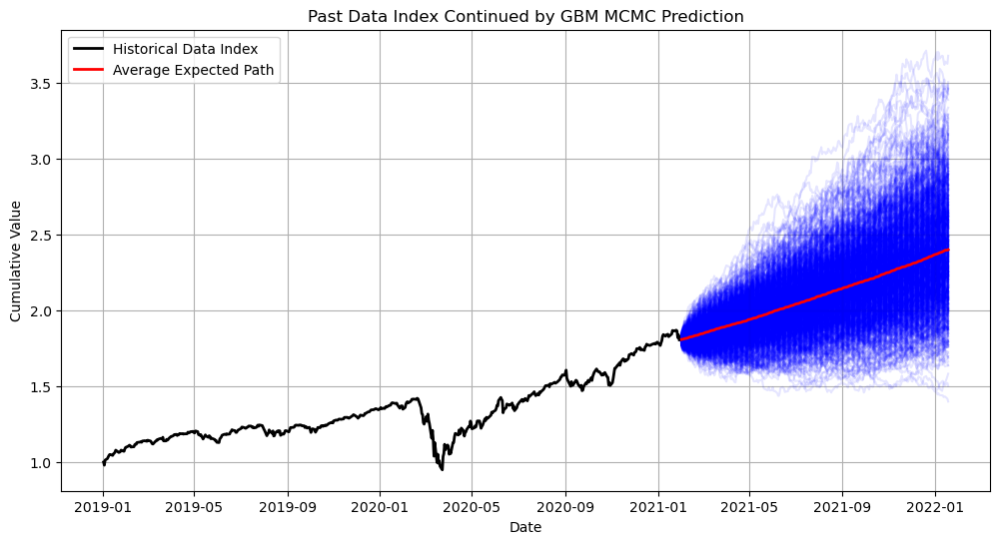

In [59]:
### Now start predicting index values for a year after this dataset; use the geometric bronian motion equation 


#Make a new timer object 
timer = Timer()

timer.start()

#Last observed price is the last value of known values in cutoff_index_df 
S0 = cutoff_index_df['Cumulative'].iloc[-1]
last_date = cutoff_index_df.index[-1]


## GBM parameters
# mu, sigma already defined directly above. Putting it here again for clarity 
new_mu = mu * 1
# new_mu = 0.05
new_sigma = sigma
# new_sigma = sigma * 1
T = 1.0 # Time period for prediction in years
dt = 1/252 # Daily time step
N = int(T / dt) # Number of time steps


#MC simulations
num_simulations = 1000
#Store each simulation; dimensions are num_simulations by N, number of predicted values in our year 
simulations = np.zeros((num_simulations, N))

#Start simulating 
for i in range(num_simulations):
    #Initialize array to store vals 
    S = np.zeros(N+1)
    #First value always same for aech simulation, last observed point 
    S[0] = S0
    #Time stepping up now 
    for t in range(1, N+1):
        #Generate a new random component in brownian differential 
        Z = np.random.normal(0,1)
        #Store current time t value 
        S[t]  = S[t-1] * np.exp((new_mu - 0.5 * new_sigma**2) * dt     +     new_sigma * np.sqrt(dt) * Z)
    #After loading all N values for this simulation i, store all results 
    simulations[i, :] = S[1:]
    
    
#Collect simulation average 
average_simulation = simulations.mean(axis=0)

#Dates for predicted values; 
    #Start date is last date of our data + 1 day
    #N periods 
    #B is business days for weekdays 
future_dates = pd.date_range(start=last_date + pd.Timedelta(days=1), periods=N, freq='B')



### === Plotting === 

plt.figure(figsize=(12,6))


#Plot our data first
plt.plot(cutoff_index_df.index, cutoff_index_df['Cumulative'], 'k-', linewidth=2, label='Historical Data Index')

#Plot individual simulations, reduce opacity with loer alpha 
for i in range(num_simulations):
    plt.plot(future_dates, simulations[i,:], 'b-', alpha=0.1)
    
    
#Plot average of simulations 
plt.plot(future_dates, average_simulation, 'r-', linewidth=2, label = 'Average Expected Path')



timer.end()


plt.xlabel('Date')
plt.ylabel('Cumulative Value')
plt.title('Past Data Index Continued by GBM MCMC Prediction')
plt.legend()
plt.grid(True)
plt.show()



Starting timer.


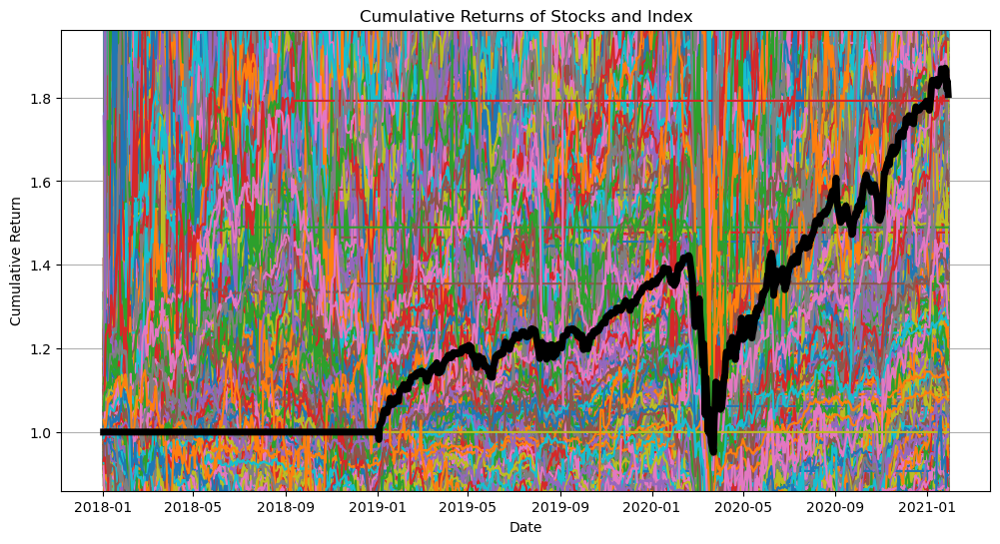

Ending timer.
Total elapsed time: 14.35361647605896 seconds



In [61]:
'''
The below plot is just to show what the cumulative returns might look like. 
This shows that the index we built is like some sort of average of any set of stocks we choose to plot. 
Plotting too many takes a while and the graph becomes a mess. 
But this is a good sign! Should mean there is some sense to the covariance model we will use these indices in. 
'''


timer.start()

# Set up the plot with size
plt.figure(figsize=(12, 6))



# Plot only the first 100 stocks' cumulative returns
for column in cum_stock_returns_df.columns:  # Select the first 100 columns first 
    plt.plot(cum_stock_returns_df.index, cum_stock_returns_df[column], label=column)

# Plot the cumulative returns of the index with an extra thick black line
plt.plot(cum_index_df.index, cum_index_df['Cumulative'], linestyle='-', linewidth=5, color='black', label='Index')


#--- Add some code to center more around the index (thicker black line); comment this out if wanted  ---
#Set range 
y_min = cum_index_df['Cumulative'].min()
y_max = cum_index_df['Cumulative'].max()
#Add some padding 
padding = 0.1 * (y_max-y_min)
plt.ylim(y_min - padding, y_max + padding)
#--- End --- 


# Plotting
plt.title('Cumulative Returns of Stocks and Index')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.grid(True)
plt.show()

timer.end()

##### To keep everything in the same place, put the above 2 plots side by side. 

Starting timer.


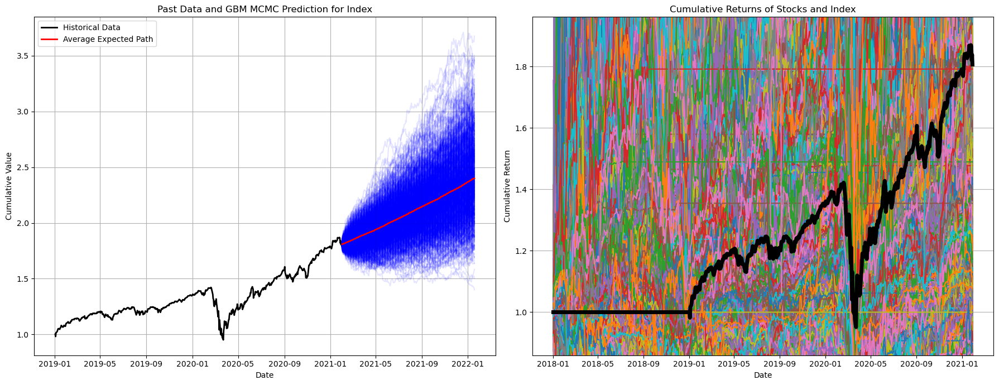

Ending timer.
Total elapsed time: 19.750403881072998 seconds



In [63]:
# Put side by side, i.e. 1 row, 2 columns
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))


timer.start()

## First block of code; plot both historical data and predictions

#Plot historical data
ax1.plot(cutoff_index_df.index, cutoff_index_df['Cumulative'], 'k-', linewidth=2, label='Historical Data')
#Plot individual simulations with lower opacity
for i in range(num_simulations):
    ax1.plot(future_dates, simulations[i,:], 'b-', alpha=0.1)
#Plot average of simulations 
ax1.plot(future_dates, average_simulation, 'r-', linewidth=2, label='Average Expected Path')

#Set labels, title, and grid for the first plot
ax1.set_xlabel('Date')
ax1.set_ylabel('Cumulative Value')
ax1.set_title('Past Data and GBM MCMC Prediction for Index')
ax1.legend()
ax1.grid(True)



## Second block of code 
y_min = cum_index_df['Cumulative'].min()
y_max = cum_index_df['Cumulative'].max()
# Add some padding (10% above and below)
padding = 0.1 * (y_max - y_min)
ax2.set_ylim(y_min - padding, y_max + padding)

# Plot cumulative returns for individual stocks
for column in cum_stock_returns_df.columns:
    ax2.plot(cum_stock_returns_df.index, cum_stock_returns_df[column], label=column)

# Plot the cumulative returns of the index with a thicker black line
ax2.plot(cum_index_df.index, cum_index_df['Cumulative'], linestyle='-', linewidth=5, color='black', label='Index')

# Set labels, title, and grid for the second plot
ax2.set_title('Cumulative Returns of Stocks and Index')
ax2.set_xlabel('Date')
ax2.set_ylabel('Cumulative Return')
ax2.grid(True)

# Display both plots side by side
plt.tight_layout()
plt.show()


timer.end()

### Section 3.2: Repeat these plots for each industry subset of tickers 

In [86]:
#To obtain data for the subsets, the necessary code to digest the full dataframes was condensed into a couple functions.
# Run the function with these files and call them to obtain our dataframes 

# %run "Process by Industry.ipynb"


#Import package I wrote in same directory for condensed commands 
from Process_by_Industry import process_industry_subset, compute_indices

In [67]:
#Before using this functions, split eveerything by industry 

## Initialize lists for each sector (see bucket_df)
energy_transportation_tickers = []
manufacturing_tickers = []
industrial_applications_services_tickers = []
financials_tickers = []
life_sciences_tickers = []
real_estate_construction_tickers = []
trade_services_tickers = []
technology_tickers = []
#No industry: Has a permno, and is present in ticker_dfs, but no matching SIC cdoe found, also catches errors 
no_industry_tickers = []

# Define a dictionary for industry lists
industry_lists = {
    "Energy & Transportation": energy_transportation_tickers,
    "Manufacturing": manufacturing_tickers,
    "Industrial Applications & Services": industrial_applications_services_tickers,
    "Financials": financials_tickers,
    "Life Sciences": life_sciences_tickers,
    "Real Estate & Construction": real_estate_construction_tickers,
    "Trade & Services": trade_services_tickers,
    "Technology": technology_tickers,
    "No Industry": no_industry_tickers
}

#Create ticker list of categories


timer.start()


# Iterate through each ticker in unique_tickers
for ticker in unique_tickers:
    try:
        #Check if ticker exists in ticker_dfs data
        if ticker not in ticker_dfs:
            print(f"{ticker} not found in ticker_dfs.")
            no_industry_tickers.append(ticker)
            continue
        
        #Extract Permno for ticker
        df = ticker_dfs[ticker]
        
        if df.empty:
            print(f"DataFrame for {ticker} is empty.")
            no_industry_tickers.append(ticker)
            continue

        #Read permno code 
        permno = df.iloc[0]['Permno']
        
        #Map permno to SIC code
        sic_df = get_sic_df[get_sic_df['LPERMNO'] == permno]
        
        if sic_df.empty:
            logging.debug(f"Permno {permno} not found in get_sic_df.") #Can raise catch 
            no_industry_tickers.append(ticker)
            continue
        
        sic = sic_df['sic'].iloc[0]
        
        #Convert SIC to int for comparison (if necessary)
        sic = int(sic)
        
        # Determine the industry for the extracted SIC code
        found = False
        for industry, sic_codes in bucket_df.items():
            sic_codes = sic_codes.dropna().astype(int)  # Ensure SIC codes are integers for comparison to the excel file --> df we have 
            if sic in sic_codes.values:
                industry_lists[industry].append(ticker)
                found = True
                break
        
        if not found:
            no_industry_tickers.append(ticker)

    except Exception as ex:
        print(f"Error processing ticker {ticker}: {ex}")
        no_industry_tickers.append(ticker)

# # Print out the lists 
# for industry, tickers in industry_lists.items():
#     print(f"{industry} Tickers: {tickers}")
# print(f"No Industry Tickers: {no_industry_tickers}")
# print(f"None Industry Tickers: {none_industry_tickers}")



timer.end()

Starting timer.
Ending timer.
Total elapsed time: 12.740535736083984 seconds



In [69]:
print(len(energy_transportation_tickers))
print(len(manufacturing_tickers))
print(len(industrial_applications_services_tickers))
print(len(financials_tickers))
print(len(life_sciences_tickers))
print(len(real_estate_construction_tickers))
print(len(trade_services_tickers))
print(len(technology_tickers))
print(len(no_industry_tickers))

#Sum lengths
total_length = (len(energy_transportation_tickers) +
                len(manufacturing_tickers) +
                len(industrial_applications_services_tickers) +
                len(financials_tickers) +
                len(life_sciences_tickers) +
                len(real_estate_construction_tickers) +
                len(trade_services_tickers) +
                len(technology_tickers) +
                len(no_industry_tickers))

print("Total length of all lists:", total_length)

726
830
541
450
925
774
714
889
3933
Total length of all lists: 9782


In [75]:
'''
With categories made, can also create the pick matrix. Columns are industries, each row is a stock (same order as everything). 
Each row (corresponding to each stock) will be a row full of 0 except for a 1 in the industry it belongs to. 
'''

timer.start()

#Industry lists
categories = list(industry_lists.keys())
category_val = [i+1 for i in range(len(categories))]

category_df = pd.DataFrame(0, index=unique_tickers, columns=categories)

#Create mapping from numeric column indices to industry names
col_mapping = dict(zip(category_val, categories))

#Rename the columns in the DataFrame
category_df.rename(columns=col_mapping, inplace=True)

# Populate the DataFrame based on industry lists
for ticker in category_df.index:
    #See structured of permno_lists; read industry string (everything is string so all good) 
    industry = permno_lists[ticker][2]

    #Map industry to any known column
    if industry in category_df.columns:
        #Set the value to 1 
        category_df.at[ticker, industry] = 1
    #Else no industry; name is different from None in permno but doesn't matter it's same categorization 
    else:
        #Set value to 1 for the column 'No Industry' 
        category_df.at[ticker, 'No Industry'] = 1 
        pass


#Save M matrix; this will be part of the pick matrix for the implied covariance process 
category_df.to_csv('M_matrix.csv', index=True)
            

timer.end()

        
category_df

Starting timer.
Ending timer.
Total elapsed time: 0.19640231132507324 seconds



,Energy & Transportation,Manufacturing,Industrial Applications & Services,Financials,Life Sciences,Real Estate & Construction,Trade & Services,Technology,No Industry
JJSF,0,1,0,0,0,0,0,0,0
DGSE,0,0,0,0,0,0,1,0,0
ELA,0,0,0,0,0,0,1,0,0
PLXS,0,1,0,0,0,0,0,0,0
RMCF,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
FN,0,1,0,0,0,0,0,0,0
BSFT,0,0,0,0,0,0,0,1,0
CBOE,0,0,0,1,0,0,0,0,0
SANW,0,0,1,0,0,0,0,0,0


### Now can start plotting index prediction and performance by industry.

#### 3.2.1: Energy & Transportation 

In [80]:
#See 'Process by Industry.ipynb' for function details 
#Call first function, to get returns, cum_returns, market_cap, weights


(energy_returns_df, 
 energy_cum_stock_returns_df, 
 energy_market_cap_df, 
 energy_weights_df) = (
     process_industry_subset(energy_transportation_tickers, returns_df, market_cap_df)
                         )

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 37.5831139087677 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.03663277626037598 seconds



In [82]:
#Call second function to get index dataframes 
(energy_index_df, energy_cum_index_df) = compute_indices(energy_returns_df, energy_weights_df, energy_cum_stock_returns_df)

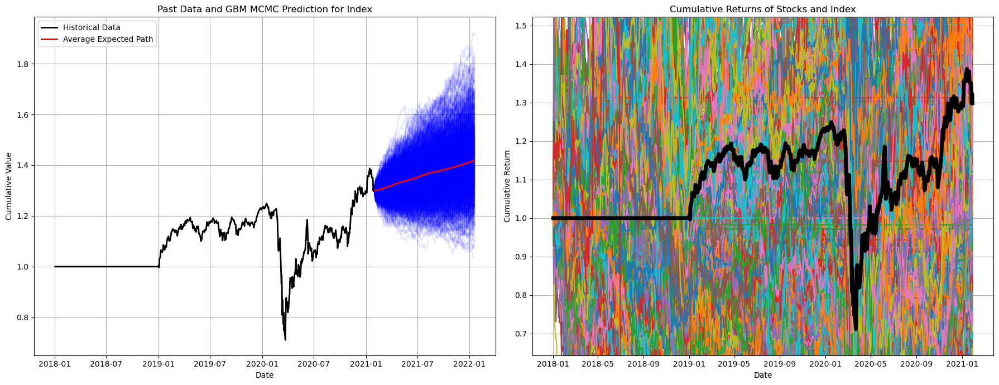

In [104]:
'''
CAREFEUL: Some issues using the .py file for some reason with imports. The %run on the ipynb works fine 
'''

#Run plotting function code
%run "Plotting Function.ipynb"
# from Plotting_Function import plotting_graphs

#Plot the graphs using the functions 
plotting_graphs(energy_cum_index_df, energy_cum_stock_returns_df)

#### 3.2.2: Manufacturing

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 45.14010787010193 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.015624523162841797 seconds



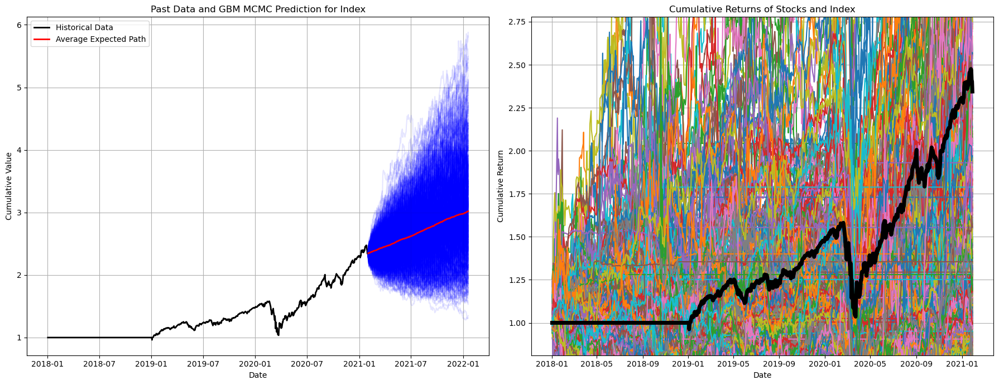

In [107]:
#Repeat for this industry

#First function
(manufacturing_returns_df, 
 manufacturing_cum_stock_returns_df, 
 manufacturing_market_cap_df, 
 manufacturing_weights_df) = (
     process_industry_subset(manufacturing_tickers, returns_df, market_cap_df)
                         )

#Second function 
(manufacturing_index_df, 
 manufacturing_cum_index_df) = compute_indices(manufacturing_returns_df, manufacturing_weights_df, manufacturing_cum_stock_returns_df)

#Plotting function 
plotting_graphs(manufacturing_cum_index_df, manufacturing_cum_stock_returns_df)

#### 3.3.3: Industrial Applications & Services

In [110]:
#Repeat for this industry

#First function
(industrial_returns_df, 
 industrial_cum_stock_returns_df, 
 industrial_market_cap_df, 
 industrial_weights_df) = (
     process_industry_subset(industrial_applications_services_tickers, returns_df, market_cap_df)
                         )

#Second function 
(industrial_index_df, 
 industrial_cum_index_df) = compute_indices(industrial_returns_df, industrial_weights_df, industrial_cum_stock_returns_df)

#Plotting function 
# plotting_graphs(industrial_cum_index_df, industrial_cum_stock_returns_df)

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 26.13165283203125 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.0 seconds



#### 3.3.4: Financials

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 22.295185804367065 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.015624761581420898 seconds



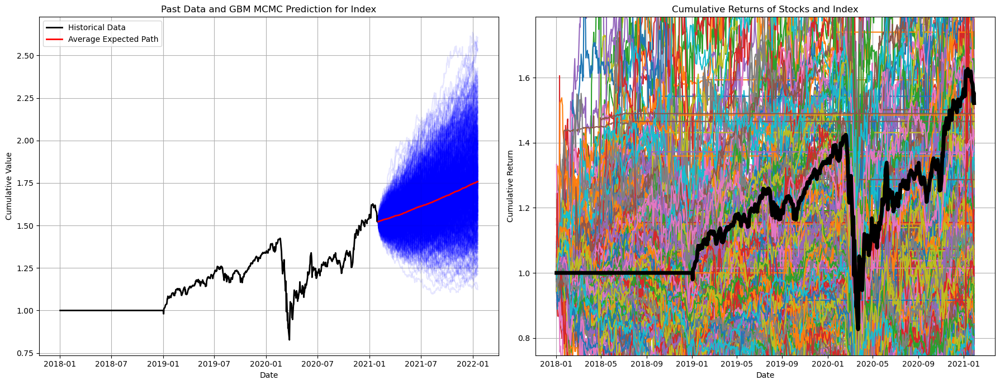

In [112]:
#Repeat for this industry

#First function
(financials_returns_df, 
 financials_cum_stock_returns_df, 
 financials_market_cap_df, 
 financials_weights_df) = (
     process_industry_subset(financials_tickers, returns_df, market_cap_df)
                         )

#Second function 
(financials_index_df, 
 financials_cum_index_df) = compute_indices(financials_returns_df, financials_weights_df, financials_cum_stock_returns_df)

#Plotting function 
plotting_graphs(financials_cum_index_df, financials_cum_stock_returns_df)

#### 3.3.5: Life Sciences

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 45.1989369392395 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.01562356948852539 seconds



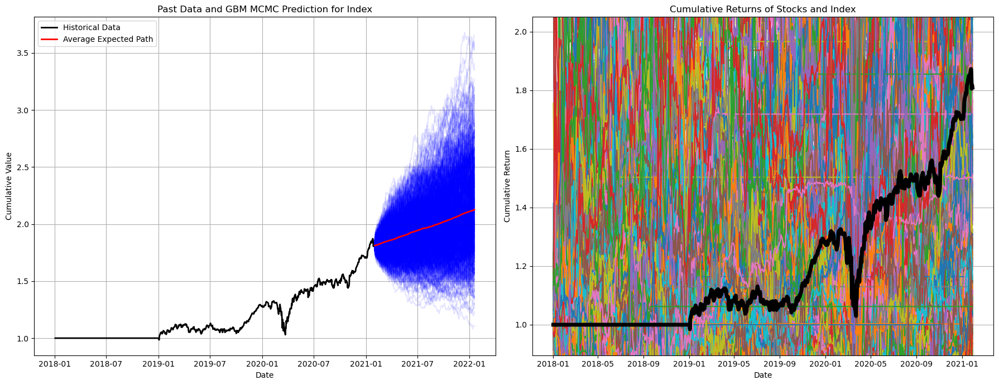

In [114]:
#Repeat for this industry

#First function
(life_sciences_returns_df, 
 life_sciences_cum_stock_returns_df, 
 life_sciences_market_cap_df, 
 life_sciences_weights_df) = (
     process_industry_subset(life_sciences_tickers, returns_df, market_cap_df)
                         )

#Second function 
(life_sciences_index_df, 
 life_sciences_cum_index_df) = compute_indices(life_sciences_returns_df, life_sciences_weights_df, life_sciences_cum_stock_returns_df)

#Plotting function 
plotting_graphs(life_sciences_cum_index_df, life_sciences_cum_stock_returns_df)

#### 3.3.6: Real Estate & Construction

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 40.2541868686676 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.015318632125854492 seconds



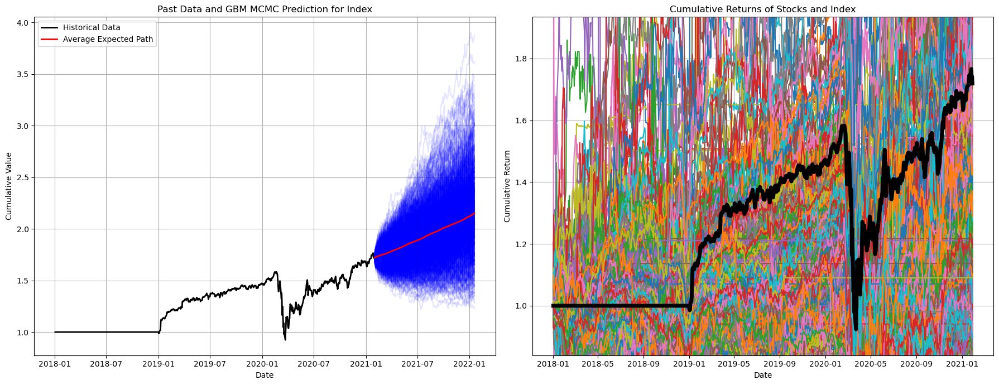

In [116]:
#Repeat for this industry

#First function
(real_estate_returns_df, 
 real_estate_cum_stock_returns_df, 
 real_estate_market_cap_df, 
 real_estate_weights_df) = (
     process_industry_subset(real_estate_construction_tickers, returns_df, market_cap_df)
                         )

#Second function 
(real_estate_index_df, 
 real_estate_cum_index_df) = compute_indices(real_estate_returns_df, real_estate_weights_df, real_estate_cum_stock_returns_df)

#Plotting function 
plotting_graphs(real_estate_cum_index_df, real_estate_cum_stock_returns_df)

#### 3.3.7: Trade & Services

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 34.638232707977295 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.013475656509399414 seconds



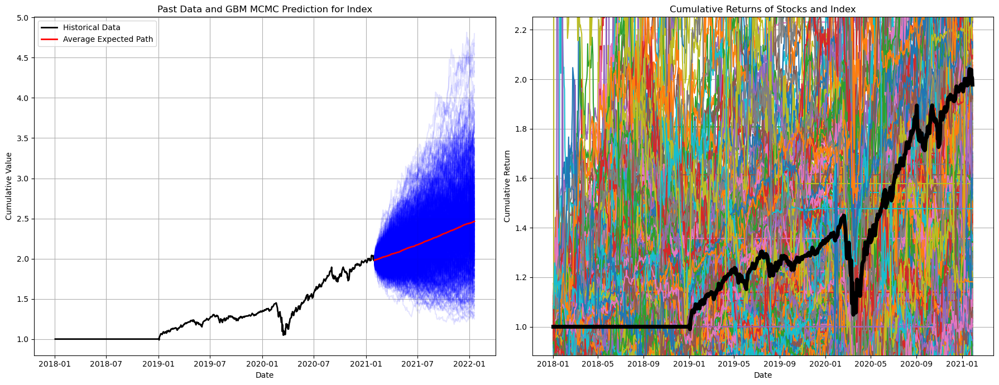

In [118]:
#Repeat for this industry

#First function
(trade_returns_df, 
 trade_cum_stock_returns_df, 
 trade_market_cap_df, 
 trade_weights_df) = (
     process_industry_subset(trade_services_tickers, returns_df, market_cap_df)
                         )

#Second function 
(trade_index_df, 
 trade_cum_index_df) = compute_indices(trade_returns_df, trade_weights_df, trade_cum_stock_returns_df)

#Plotting function 
plotting_graphs(trade_cum_index_df, trade_cum_stock_returns_df)

#### 3.3.8: Technology

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 48.81384539604187 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.016351699829101562 seconds



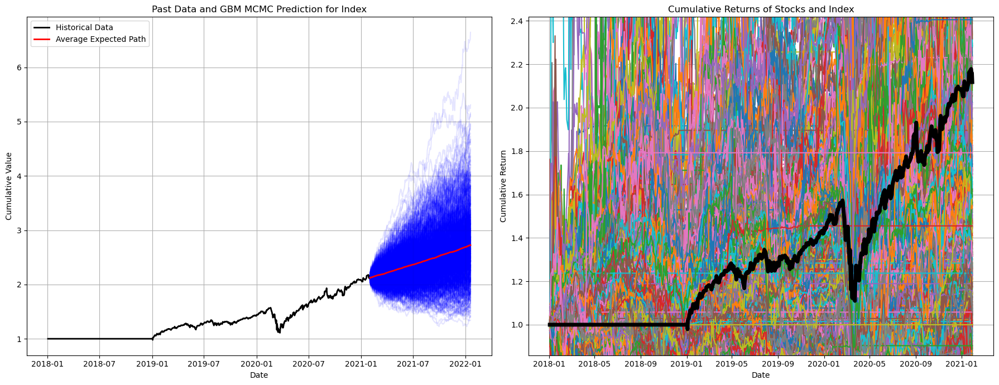

In [120]:
#Repeat for this industry

#First function
(technology_returns_df, 
 technology_cum_stock_returns_df, 
 technology_market_cap_df, 
 technology_weights_df) = (
     process_industry_subset(technology_tickers, returns_df, market_cap_df)
                         )

#Second function 
(technology_index_df, 
 technology_cum_index_df) = compute_indices(technology_returns_df, technology_weights_df, technology_cum_stock_returns_df)

#Plotting function 
plotting_graphs(technology_cum_index_df, technology_cum_stock_returns_df)

#### 3.3.9: No Industry 

Step 1 done: Returns dataframe.
Starting timer.
Step 2 done: Cumulative Returns dataframe.
Ending timer.
Total elapsed time: 216.28358817100525 seconds

Step 3 done: Market cap dataframe.
Starting timer.
Step 4 done: Weights dataframe.

----- Returning values -----
Ending timer.
Total elapsed time: 0.0624852180480957 seconds



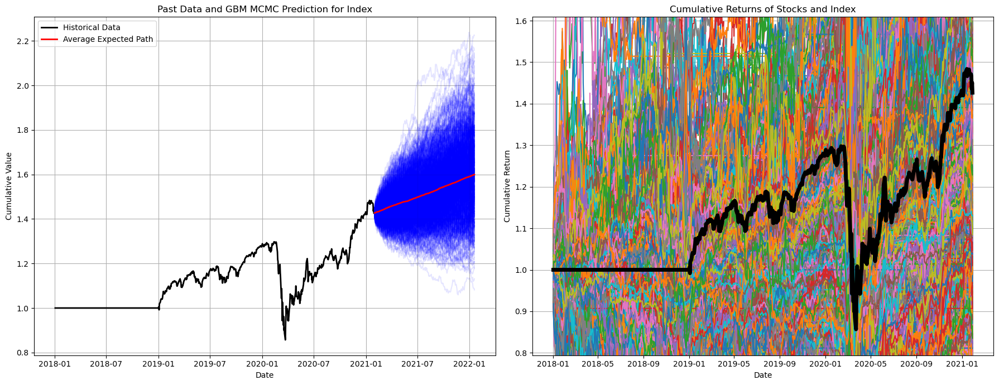

In [122]:
#Repeat for this industry

#First function
(no_industry_returns_df, 
 no_industry_cum_stock_returns_df, 
 no_industry_market_cap_df, 
 no_industry_weights_df) = (
     process_industry_subset(no_industry_tickers, returns_df, market_cap_df)
                         )

#Second function 
(no_industry_index_df, 
 no_industry_cum_index_df) = compute_indices(no_industry_returns_df, no_industry_weights_df, no_industry_cum_stock_returns_df)

#Plotting function 
plotting_graphs(no_industry_cum_index_df, no_industry_cum_stock_returns_df)

#### 3.3.10: Plot all indices together 

In [135]:
#First merge all the cumulative columns into one df 

industry_dataframes = [
    energy_cum_index_df,
    manufacturing_cum_index_df,
    industrial_cum_index_df,
    financials_cum_index_df,
    life_sciences_cum_index_df,
    real_estate_cum_index_df,
    trade_cum_index_df,
    technology_cum_index_df,
    no_industry_cum_index_df
]

# Extract the 'Cumulative' column from each dataframe and concatenate them
cumulative_dfs = [df[['Cumulative']] for df in industry_dataframes]
merged_cum_index_df = pd.concat(cumulative_dfs, axis=1)

# Rename columns by industry
merged_cum_index_df.columns = [
    'Energy_Cumulative',
    'Manufacturing_Cumulative',
    'Industrial_Cumulative',
    'Financials_Cumulative',
    'Life_Sciences_Cumulative',
    'Real_Estate_Cumulative',
    'Trade_Cumulative',
    'Technology_Cumulative',
    'No_Industry_Cumulative'
]


merged_cum_index_df

,Energy_Cumulative,Manufacturing_Cumulative,Industrial_Cumulative,Financials_Cumulative,Life_Sciences_Cumulative,Real_Estate_Cumulative,Trade_Cumulative,Technology_Cumulative,No_Industry_Cumulative
Date,,,,,,,,,
2018-01-02,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2018-01-03,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2018-01-04,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2018-01-05,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2018-01-08,1.000000,1.000000,1.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...
2021-01-25,1.350852,2.475346,1.801265,1.580082,1.872484,1.752505,2.032151,2.175369,1.471086
2021-01-26,1.332559,2.468101,1.787551,1.570255,1.860678,1.766245,2.038649,2.178005,1.466403
2021-01-27,1.298114,2.412315,1.735511,1.524080,1.805131,1.731144,1.992015,2.129959,1.435515


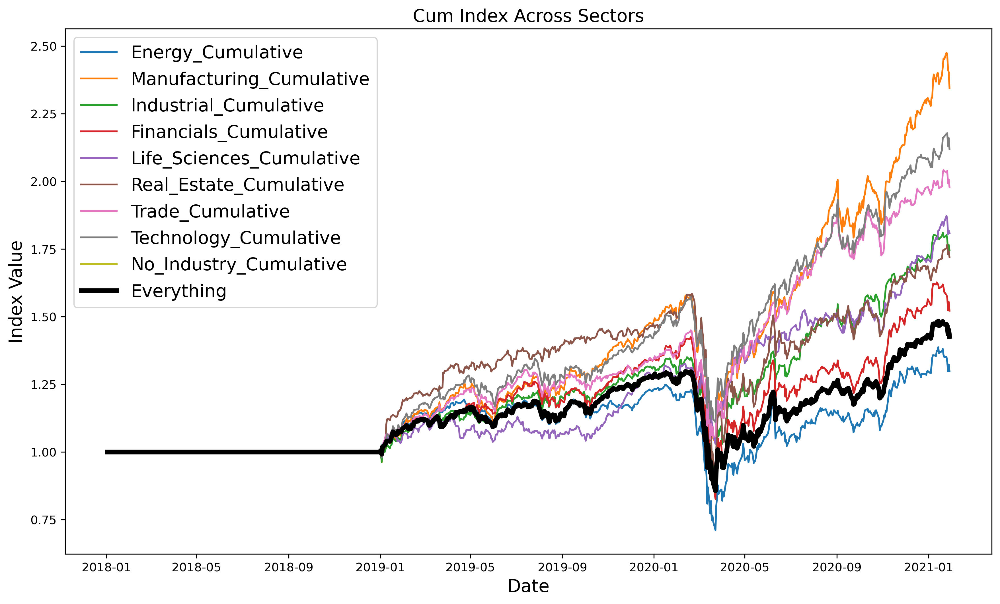

In [137]:
#Dates are all same from all the processing done in this file, pick a random one for date index as x axis 
dates = merged_cum_index_df.index

#Plot 
plt.figure(figsize = (14,8), dpi=300)

for column in merged_cum_index_df.columns:
    sns.lineplot(x=dates, y=merged_cum_index_df[column], label = column)
    
sns.lineplot(x=dates, y=merged_cum_index_df[column], label='Everything', linewidth=4, color='black')
    
#Customize
plt.title('Cum Index Across Sectors', size=15)
plt.xlabel('Date', size=15)
plt.ylabel('Index Value', size=15)
plt.legend(fontsize=15)
plt.show()

In [152]:
#Also save a dataframe of industry indices concatenated (load into Part 2)

not_cum_industry_dataframes = [
    energy_index_df,
    manufacturing_index_df,
    industrial_index_df,
    financials_index_df,
    life_sciences_index_df,
    real_estate_index_df,
    trade_index_df,
    technology_index_df,
    no_industry_index_df
]

# Extract the 'Cumulative' column from each dataframe and concatenate them
index_dfs = [df[['Diagonal']] for df in not_cum_industry_dataframes]
merged_index_df = pd.concat(index_dfs, axis=1)

# Rename columns by industry
merged_index_df.columns = [
    'Energy_Index',
    'Manufacturing_Index',
    'Industrial_Index',
    'Financials_Index',
    'Life_Sciences_Index',
    'Real_Estate_Index',
    'Trade_Index',
    'Technology_Index',
    'No_Industry_Index'
]


#Take cutoff date since data from 2018 didn't load initially 
cutoff_date = '2019-01-02' 

merged_index_df = merged_index_df[merged_index_df.index >= cutoff_date] 


# Save the DataFrame to a pickle file using pandas
merged_index_df.to_pickle('merged_index_df.pkl')

print("DataFrame saved to merged_index_df.pkl and ready to load into Part 2.")

DataFrame saved to merged_index_df.pkl and ready to load into Part 2.


# Section 4: Try replacing MCMC with Kalman filter to update "historic" data dynamically

### Goal is to get more accurate long term predictions. While MCMC can describe generic trends, as time goes on the uncertainty may become a hurdle.

In [140]:
#Get scammed, coming soon. Need some text below 

In [142]:
energy_index_df

,Diagonal
Date,
2018-01-02,0.000000
2018-01-03,0.000000
2018-01-04,0.000000
2018-01-05,0.000000
2018-01-08,0.000000
...,...
2021-01-25,-0.000161
2021-01-26,-0.013542
2021-01-27,-0.025848


## Section B1: Load for Part 2

Anything built here in Part 1 that is required for Part 2 that we have not already saved will be added in this Bonus Section

In [156]:
current_name = '9782_returns_df.pkl'

returns_df.to_pickle(current_name)
print(f"DataFrame saved to {current_name} and ready to load into Part 2.")

DataFrame saved to 9782_returns_df.pkl and ready to load into Part 2.


In [166]:
## Cut paste from Part 2 after splitting 
# Define your industries and their corresponding tickers
industries = {
    "Energy": energy_transportation_tickers,
    "Manufacturing": manufacturing_tickers,
    "Industrial Applications & Services": industrial_applications_services_tickers,
    "Financials": financials_tickers,
    "Life Sciences": life_sciences_tickers,
    "Real Estate & Construction": real_estate_construction_tickers,
    "Trade & Services": trade_services_tickers,
    "Technology": technology_tickers,
    "No Industry": no_industry_tickers,
}


#Save pickle 
current_name = '9782_industries.pkl'

#Context manager since no pandas attribute equivalent on dict 
with open(current_name, 'wb') as f:
    pickle.dump(industries, f)

print(f"Dictionary saved to {current_name} and ready to load into Part 2.")

Dictionary saved to 9782_industries.pkl and ready to load into Part 2.
